# ST563 Final Report



### Teddie Hall, Kajal Gupta, Nan Liu, Alysia Yan

## Dataset and Problem Context

The [Air Quality dataset](https://archive.ics.uci.edu/dataset/360/air+quality) comes from the UC Irvine Machine Learning Repository. The [paper](https://www.sciencedirect.com/science/article/abs/pii/S0925400507007691?via%3Dihub) introducing this dataset explains that it contains a series of sensor measurements for various gases used to evaluate air quality. The original context of this data was an experiment comparing the performance of a novel multi-sensor device developed by Pirelli Labs with a set of sensors owned by the Lombardy Regional Agency for Environmental Protection (ARPA). We will refer to the set of sensors in the novel device as the experimental sensor group and the set of sensors in the ARPA monitoring station as the conventional sensor group. Both groups of sensors were located in the same place on a busy street in an Italian city and collected data for about one year (3/10/2004 - 4/04/2005).

#### Variables
*   **Date**
*   **Time**
*   **CO(GT)**: carbon monoxide measurement, conventional sensor group
*   **PT08.S1(CO)**: carbon monoxide measurement, experimental sensor group
*   **NMHC(GT)**: non-methane hydrocarbons measurement, conventional sensor group
*   **PT08.S2(NMHC)**: non-methane hydrocarbons measurement, experimental sensor group
*   **NOx(GT)**: nitrogen oxide measurement, conventional sensor group
*   **PT08.S3(NOx)**: nitrogen oxide measurement, experimental sensor group
*   **NO2(GT)**: nitrogen dioxide measurement, conventional sensor group
*   **PT08.S4(NO2)**: nitrogen dioxide measurement, experimental sensor group
*   **PT08.S5(O3)**: ozone measurement, experimental sensor group
*   **T**: temperature in degrees Celcius, experimental sensor group
*   **RH**: relative humidity by percentage, experimental sensor group
*   **AH**: absolute humidity, experimental sensor group
*   **C6H6(GT)**: benzene measurement, conventional sensor group, target variable

The experimental sensor group measured the hourly average levels of each chemical. The conventional NMHC, NOx, and NO2 sensors measure the true hourly average levels in microg/m^3. The conventional CO sensor measures the true hourly average CO levels in mg/m^3.

For the midterm, we predicted benzene (C6H6) levels using the other sensor variables as predictors. This model performed extremely well with very little adjustment because of the high linear correlation the other gases have with benzene. We also found some strong hourly and seasonal patterns in the levels of gases using time series analysis. The plots showing patterns for NO2, CO, and C6H6 are shown below:

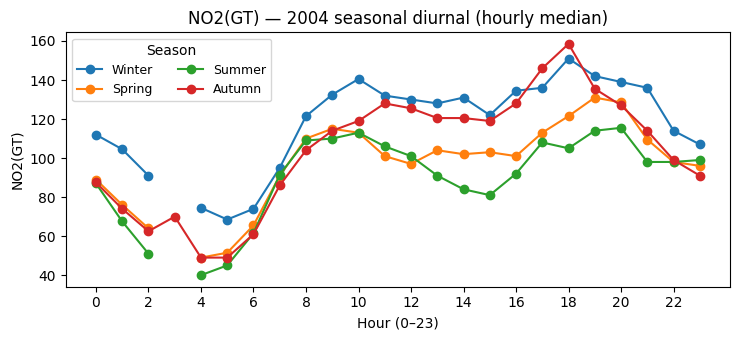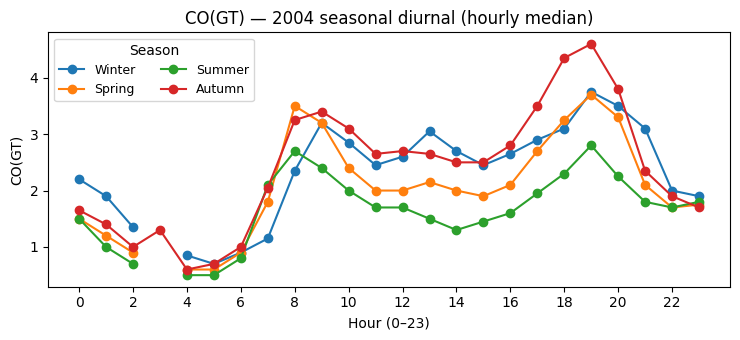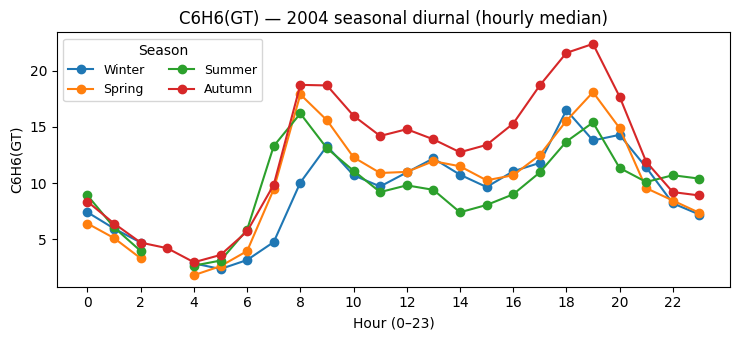

### Goal and Methods

To increase the difficulty and create a more practical model for our final project, our goal is to forecast the air quality level 24 hours in the future. Because high levels of benzene (C6H6), carbon monoxide (CO), and nitrogen dioxide (NO2) are some of the indicators for poor air quality levels, we were interested in forecasting these three variables. We accomplished this by performing regression using the sensor variables and some time-based variables as predictors, with C6H6(GT), CO(GT), or NO2(GT) shifted 24 hours as target variables. We tested several modeling methods (Elastic Net, Random Forest, XGBoost, Deep Learning, Long Short-Term Memory) to fit three regressors for each of the gases of interest. The performance measures used to compare the models were MSE, MAE and R<sup>2</sup>. We used an unsupervised clustering model (heirarchical clustering) to create three air quality levels based on benzene, carbon monoxide, and nitrogen dioxide levels. Then, we used the forcasted values for these three gases to predict which cluster each prediction belonged to.

In [ ]:
# Import dataset and perform data processing

!pip install ucimlrepo
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import ElasticNetCV
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from ucimlrepo import fetch_ucirepo
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
from torchvision import datasets, transforms

random.seed(42)

# Fetch dataset from UCI ML Repo
air_quality = fetch_ucirepo(id=360)

# Data (as pandas dataframe)
air_qual = air_quality.data.features

# Replace -200 values with NaN
air_qual.replace(-200, np.nan, inplace=True)

# Combine Date and Time columns
datetime = air_qual["Date"] + " " + air_qual["Time"]
air_qual["Datetime"] = pd.to_datetime(datetime, format="mixed")
air_qual.drop(["Date", "Time"], axis=1, inplace=True)

# Drop NMCH(GT) because it has too many missing values
air_qual.drop(["NMHC(GT)"], axis=1, inplace=True)

# Rearrange columns so that Datetime is first and benzene is last
datetime = air_qual.pop("Datetime")
benzene = air_qual.pop("C6H6(GT)")
air_qual.insert(0, "Datetime", datetime)
air_qual.insert(12, "C6H6(GT)", benzene)

# Add columns of CO, NO2, C6H6 values shifted 24 hours in the future
air_qual["CO_shifted"] = air_qual["CO(GT)"].shift(periods=-24)
air_qual["NO2_shifted"] = air_qual["NO2(GT)"].shift(periods=-24)
air_qual["C6H6_shifted"] = air_qual["C6H6(GT)"].shift(periods=-24)

## Exploratory Data Analysis

In [ ]:
air_qual.describe().T

,count,mean,min,25%,50%,75%,max,std
Datetime,9357,2004-09-21 16:00:00,2004-03-10 18:00:00,2004-06-16 05:00:00,2004-09-21 16:00:00,2004-12-28 03:00:00,2005-04-04 14:00:00,NaN
CO(GT),7674.0,2.15275,0.1,1.1,1.8,2.9,11.9,1.453252
PT08.S1(CO),8991.0,1099.833166,647.0,937.0,1063.0,1231.0,2040.0,217.080037
PT08.S2(NMHC),8991.0,939.153376,383.0,734.5,909.0,1116.0,2214.0,266.831429
NOx(GT),7718.0,246.896735,2.0,98.0,180.0,326.0,1479.0,212.979168
PT08.S3(NOx),8991.0,835.493605,322.0,658.0,806.0,969.5,2683.0,256.81732
NO2(GT),7715.0,113.091251,2.0,78.0,109.0,142.0,340.0,48.370108
PT08.S4(NO2),8991.0,1456.264598,551.0,1227.0,1463.0,1674.0,2775.0,346.206794
PT08.S5(O3),8991.0,1022.906128,221.0,731.5,963.0,1273.5,2523.0,398.484288
T,8991.0,18.317829,-1.9,11.8,17.8,24.4,44.6,8.832116


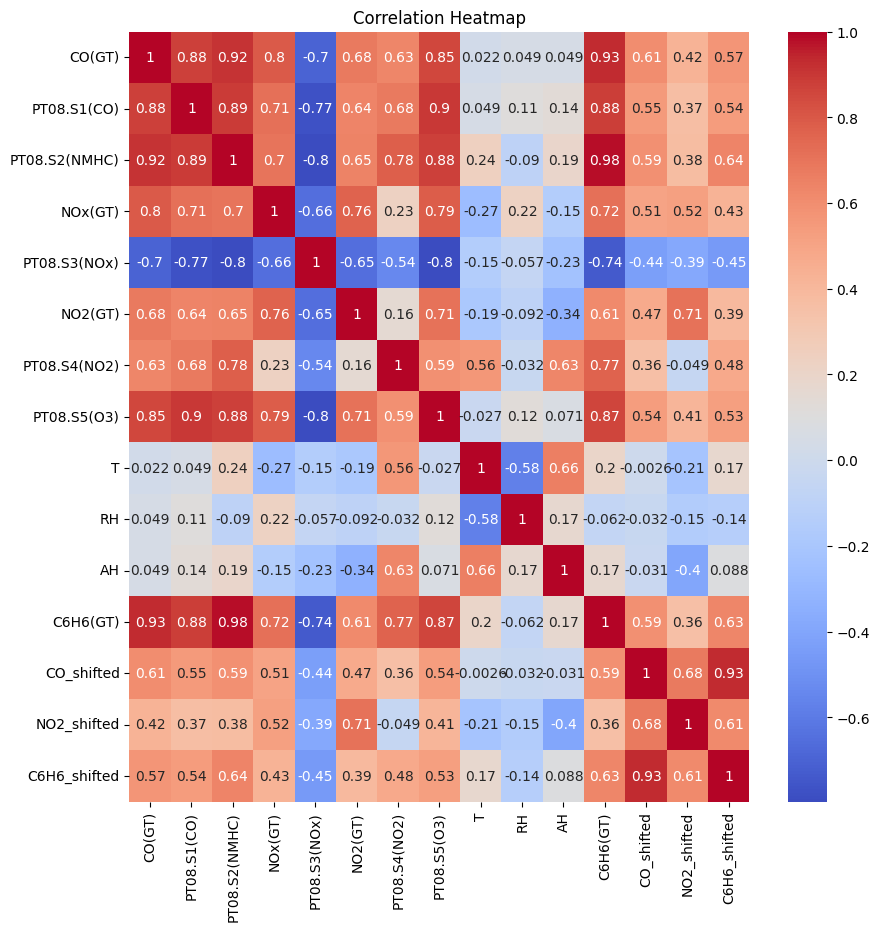

In [ ]:
# Correlation heat map
corr = air_qual.select_dtypes(include='number').corr()
plt.figure(figsize=(10, 10))
sns.heatmap(corr, cmap="coolwarm", annot=True)
plt.title("Correlation Heatmap")
plt.show()

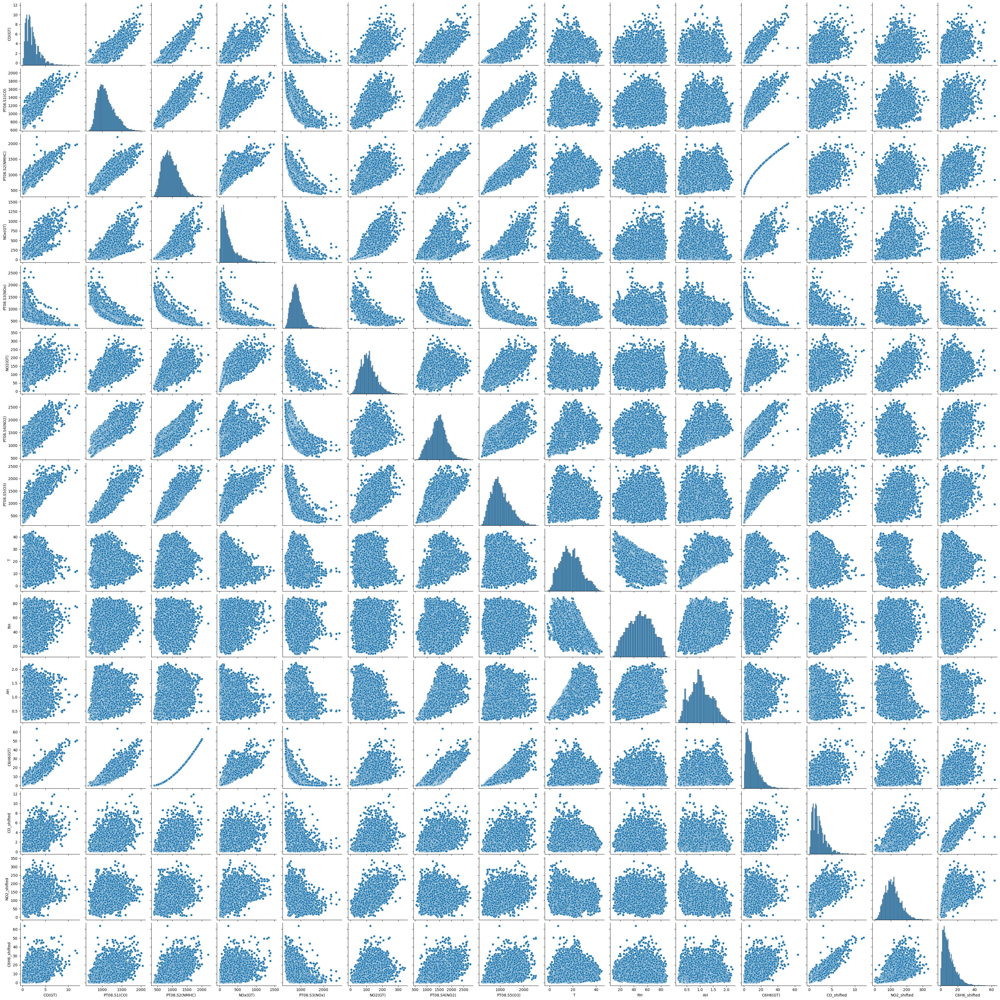

In [ ]:
# Pair plots
sns.pairplot(data = air_qual);

The shifted variables have significantly weaker correlations with the rest of the variables.

In [ ]:
# Time features (cyclic hour, day-of-week, month)
dt = air_qual["Datetime"]
hour = dt.dt.hour
dow  = dt.dt.dayofweek
mon  = dt.dt.month

air_qual["hour_sin"] = np.sin(2*np.pi*hour/24)
air_qual["hour_cos"] = np.cos(2*np.pi*hour/24)
air_qual["dow_sin"]  = np.sin(2*np.pi*dow/7)
air_qual["dow_cos"]  = np.cos(2*np.pi*dow/7)
air_qual["mon_sin"]  = np.sin(2*np.pi*mon/12)
air_qual["mon_cos"]  = np.cos(2*np.pi*mon/12)

# Drop all rows with missing values
air_qual.dropna(inplace = True)
air_qual.head()

air_qual.head()

,Datetime,CO(GT),PT08.S1(CO),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,...,C6H6(GT),CO_shifted,NO2_shifted,C6H6_shifted,hour_sin,hour_cos,dow_sin,dow_cos,mon_sin,mon_cos
0,2004-03-10 18:00:00,2.6,1360.0,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,...,11.9,4.8,151.0,20.8,-1.000000,-1.836970e-16,0.974928,-0.222521,1.0,6.123234e-17
1,2004-03-10 19:00:00,2.0,1292.0,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,...,9.4,6.9,172.0,27.4,-0.965926,2.588190e-01,0.974928,-0.222521,1.0,6.123234e-17
2,2004-03-10 20:00:00,2.2,1402.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,...,9.0,6.1,165.0,24.0,-0.866025,5.000000e-01,0.974928,-0.222521,1.0,6.123234e-17
3,2004-03-10 21:00:00,2.2,1376.0,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,...,9.2,3.9,136.0,12.8,-0.707107,7.071068e-01,0.974928,-0.222521,1.0,6.123234e-17
4,2004-03-10 22:00:00,1.6,1272.0,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,...,6.5,1.5,85.0,4.7,-0.500000,8.660254e-01,0.974928,-0.222521,1.0,6.123234e-17


Based on the seasonal and hourly patterns we observed in our midterm project analysis, we added hour, day of week (dow), and month (mon) as predictors for the models in this project. Because of the cyclical nature of these variables, we transformed them with a sine or cosine function.

## Conformal Prediction

In [ ]:
# Conformal Prediction
# Build split conformal prediction intervals for 24-hour-ahead benzene concentration forecasts

# Copy the cleaned air_qual DataFrame to construct a time-ordered dataset
aq = air_qual.copy()
aq["Datetime"] = pd.to_datetime(aq["Datetime"], errors="coerce")

# Drop invalid timestamps and sort chronologically
aq = aq.dropna(subset=["Datetime"]).sort_values("Datetime")

# 1. Construct the 24-hour-ahead target variable
HORIZON = 24
TARGET_COL = "C6H6(GT)"

aq_cp = aq.copy()
aq_cp["benzene_t_plus24"] = aq_cp[TARGET_COL].shift(-HORIZON)

# Remove the last 24 rows that lack future targets
aq_cp = aq_cp.dropna(subset=["benzene_t_plus24"]).reset_index(drop=True)

print("Number of samples used for conformal prediction:", len(aq_cp))

# 2. Build time features, feature matrix X, and target y

aq_cp["hour"] = aq_cp["Datetime"].dt.hour
aq_cp["dayofweek"] = aq_cp["Datetime"].dt.dayofweek
aq_cp["month"] = aq_cp["Datetime"].dt.month

# Drop Datetime column
aq_features = aq_cp.drop(columns=["Datetime"])

# Target variable
y = aq_features["benzene_t_plus24"].to_numpy()

# Feature matrix
feature_cols = [col for col in aq_features.columns if col != "benzene_t_plus24"]
X = aq_features[feature_cols].to_numpy()

print("Number of features:", len(feature_cols))
print("First few feature names:", feature_cols[:10])

# 3. Time-based Train / Calibration / Test split (60 / 20 / 20)

n = len(aq_cp)
train_end = int(n * 0.6)
calib_end = int(n * 0.8)

X_train, y_train = X[:train_end], y[:train_end]
X_calib, y_calib = X[train_end:calib_end], y[train_end:calib_end]
X_test, y_test = X[calib_end:], y[calib_end:]

print(f"Train size: {len(y_train)}, Calib size: {len(y_calib)}, Test size: {len(y_test)}")

# 4. Base regression model: ElasticNetCV

from sklearn.linear_model import ElasticNetCV

base_model = ElasticNetCV(
    l1_ratio=[0.1, 0.5, 0.7, 0.9, 0.95, 0.99, 1.0],
    cv=5,
    random_state=42,
    n_alphas=100
)

base_model.fit(X_train, y_train)

# 5. Compute nonconformity scores on the calibration set

y_calib_pred = base_model.predict(X_calib)
calib_scores = np.abs(y_calib - y_calib_pred)

print("First 5 calibration scores:", calib_scores[:5])

# 6. Compute q_hat for split conformal prediction

ALPHA = 0.05
n_calib = len(calib_scores)

q_level = float(np.minimum(1.0, np.ceil((n_calib + 1) * (1 - ALPHA)) / n_calib))

try:
    q_hat = np.quantile(calib_scores, q_level, method="higher")
except TypeError:
    q_hat = np.quantile(calib_scores, q_level, interpolation="higher")

print(f"q_hat (alpha={ALPHA}) =", q_hat)
print(f"Quantile level q_level = {q_level:.4f}")

# 7. Construct prediction intervals on the test set

y_test_pred = base_model.predict(X_test)

lower = y_test_pred - q_hat
upper = y_test_pred + q_hat

# 8. Compute empirical coverage and average interval width

covered = (y_test >= lower) & (y_test <= upper)

coverage = covered.mean()
avg_width = np.mean(upper - lower)

print(f"Conformal prediction interval coverage (test) = {coverage:.3f}")
print(f"Conformal prediction interval average width (test) = {avg_width:.3f}")

# 9. Assemble a DataFrame of test results for reporting

results_df = pd.DataFrame({
    "y_true": y_test,
    "y_pred": y_test_pred,
    "lower": lower,
    "upper": upper,
    "covered": covered
})

print("\nFirst 10 prediction intervals in the test set:")
print(results_df.head(10))

Number of samples used for conformal prediction: 6174
Number of features: 24
First few feature names: ['CO(GT)', 'PT08.S1(CO)', 'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH']
Train size: 3704, Calib size: 1235, Test size: 1235
First 5 calibration scores: [ 6.47409796  5.68788315  8.01259003 21.60902468 20.42886452]
q_hat (alpha=0.05) = 13.216468688641354
Quantile level q_level = 0.9514
Conformal prediction interval coverage (test) = 0.985
Conformal prediction interval average width (test) = 26.433

First 10 prediction intervals in the test set:
   y_true     y_pred     lower      upper  covered
0     4.2   8.183667 -5.032802  21.400136     True
1    16.7   8.846879 -4.369589  22.063348     True
2    29.1   9.333188 -3.883281  22.549657    False
3    20.7  17.122927  3.906459  30.339396     True
4    15.5  22.891474  9.675006  36.107943     True
5    10.3  19.698630  6.482161  32.915099     True
6    13.8  17.993961  4.777493  31.210430 

To quantify uncertainty in our 24-hour-ahead benzene forecasts, we applied split conformal prediction using the ElasticNet model as the base predictor. After constructing the future benzene target via a 24-step forward shift and generating time-based features, the dataset was split chronologically into training (60%), calibration (20%), and testing (20%) subsets to avoid information leakage. Conformal prediction computes residual-based nonconformity scores on the calibration set and uses their empirical quantile to form distribution-free prediction intervals. The resulting conformal radius was 13.22, producing an average interval width of approximately 26.43 units on the test set. Although the empirical coverage reached 98.5%, exceeding the nominal 95% requirement, the intervals were excessively wide and therefore not practically informative; such broad intervals suggest large uncertainty rather than accurate forecasts. This limitation motivated us to move beyond the conformal prediction model and explore more advanced forecasting approaches in the subsequent stages of our analysis.

# Forecast Modeling

Using all sensors and the time-related predictor variables shown above, we fit three models which forecast levels of the gases CO, NO2, and C6H6 24 hours in the future. We used the following model types with this set of variables:

*   Elastic Net
*   Random Forest
*   XGBoost
*   Deep Learning

Then, we fit three simple Long Short-Term Memory (LSTM) model using 24 continuous measurements of the three gases to predict the corresponding gas 24 hours after the last measurement in the sequence.


In [ ]:
# Chronological 80-20 Train/Test Split
X = air_qual.drop(["Datetime", "CO_shifted", "NO2_shifted", "C6H6_shifted"], axis=1)
y = air_qual[["CO_shifted", "NO2_shifted", "C6H6_shifted"]]

n = len(air_qual)
split = int(n * 0.80)
X_trn, X_tst = X.iloc[:split], X.iloc[split:]
y_trn, y_tst = y.iloc[:split], y.iloc[split:]

# Initialize dataframe to collect predicted
pred_vals_df = y_tst.copy()
pred_vals_df.rename(columns={'CO_shifted': 'CO_actual',
                             'NO2_shifted': 'NO2_actual',
                             'C6H6_shifted': 'C6H6_actual'},
                    inplace=True)

# Display sample sizes of the training and testing sets
print(f"Training Set Size: {len(X_trn)}, Testing Set Size: {len(X_tst)}")

Training Set Size: 4958, Testing Set Size: 1240


In [ ]:
# Model evaluation function
# Input:
#     model_name: string for the model name
#     var_name: string for the target variable name
#     y_pred: predicted y-values
# Output:
#     metrics_df: dataframe containing the model name, testing MSE, MAE, and R^2
def model_eval(model_name, var_name, y_pred):
  MSE = mean_squared_error(y_tst[var_name], y_pred)
  MAE = mean_absolute_error(y_tst[var_name], y_pred)
  r2 = r2_score(y_tst[var_name], y_pred)

  metrics = {
    "Model": model_name,
    "Testing MSE": [MSE],
    "Testing MAE": [MAE],
    "Testing R2": [r2]
  }
  metrics_df = pd.DataFrame(metrics)
  return metrics_df

## Elastic Net Model

In [ ]:
alpha_values = [0.001, 0.00278, 0.00774, 0.02154, 0.05995, 0.16681, 0.46416, 1.29155, 3.59381, 10.0]
l1_ratio_values = [0.1, 0.5, 0.7, 0.9, 0.95, 0.99, 1.0]

# Fit CO model
en_co = ElasticNetCV(alphas = alpha_values, l1_ratio = l1_ratio_values, cv=5, random_state=42)
en_co.fit(X_trn, y_trn["CO_shifted"])

# Fit NO2 model
en_no2 = ElasticNetCV(alphas = alpha_values, l1_ratio = l1_ratio_values, cv=5, random_state=42)
en_no2.fit(X_trn, y_trn["NO2_shifted"])

# Fit C6H6 model
en_c6h6 = ElasticNetCV(alphas = alpha_values, l1_ratio = l1_ratio_values, cv=5, random_state=42)
en_c6h6.fit(X_trn, y_trn["C6H6_shifted"])

# Make predictions on the test set
y_en_co_pred = en_co.predict(X_tst)
y_en_no2_pred = en_no2.predict(X_tst)
y_en_c6h6_pred = en_c6h6.predict(X_tst)

# Add predicted values to pred_vals_df
pred_vals_df["CO_en"] = y_en_co_pred
pred_vals_df["NO2_en"] = y_en_no2_pred
pred_vals_df["C6H6_en"] = y_en_c6h6_pred

# Evaluate the model
co_metrics_df = model_eval("Elastic Net", "CO_shifted", y_en_co_pred)
no2_metrics_df = model_eval("Elastic Net", "NO2_shifted", y_en_no2_pred)
c6h6_metrics_df = model_eval("Elastic Net", "C6H6_shifted", y_en_c6h6_pred)

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5119.858717705123, tolerance: 762.3357421079174
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14728.407590167597, tolerance: 762.3357421079174
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1371.5745364427567, tolerance: 737.9117199395009
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceW

## Random Forest Model

In [ ]:
# Random Forest for C6H6
rf = RandomForestRegressor(
    n_estimators=600,
    max_depth=12,
    min_samples_leaf=3,
    n_jobs=-1,
    random_state=42
)
rf.fit(X_trn, y_trn["C6H6_shifted"])
pred_te = rf.predict(X_tst)

# Evaluate model

new_row = model_eval("Random Forest", "C6H6_shifted", pred_te)
c6h6_metrics_df = pd.concat([c6h6_metrics_df, new_row], ignore_index=True)

# Top features
imp = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)
print("\nTop features:")
display(imp.head(12))

# Add predicted values to pred_vals_df
pred_vals_df["C6H6_rf"] = pred_te


Top features:


,0
PT08.S2(NMHC),0.319989
dow_sin,0.120193
hour_sin,0.064091
hour_cos,0.062550
C6H6(GT),0.057471
dow_cos,0.044940
PT08.S5(O3),0.040116
AH,0.036677
PT08.S3(NOx),0.031646
CO(GT),0.031481


In [ ]:
# Random Forest for CO
rf = RandomForestRegressor(
    n_estimators=600,
    max_depth=12,
    min_samples_leaf=3,
    n_jobs=-1,
    random_state=42
)
rf.fit(X_trn, y_trn['CO_shifted'])
pred_te = rf.predict(X_tst)

# Evaluate model
new_row = model_eval("Random Forest", "CO_shifted", pred_te)
co_metrics_df = pd.concat([co_metrics_df, new_row], ignore_index=True)

# Top features
imp = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)
print("\nTop features:")
display(imp.head(12))

# Add predicted values to pred_vals_df
pred_vals_df["CO_rf"] = pred_te


Top features:


,0
CO(GT),0.359379
dow_sin,0.094880
hour_sin,0.078191
NOx(GT),0.076120
hour_cos,0.046686
AH,0.042589
T,0.036555
PT08.S5(O3),0.034440
dow_cos,0.032872
RH,0.031010


In [ ]:
# Random Forest for NO2
rf = RandomForestRegressor(
    n_estimators=600,
    max_depth=12,
    min_samples_leaf=3,
    n_jobs=-1,
    random_state=42
)
rf.fit(X_trn, y_trn["NO2_shifted"])
pred_te = rf.predict(X_tst)

# Evaluate model
new_row = model_eval("Random Forest", "NO2_shifted", pred_te)
no2_metrics_df = pd.concat([no2_metrics_df, new_row], ignore_index=True)

# Top features
imp = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)
print("\nTop features:")
display(imp.head(12))

# Add predicted values to pred_vals_df
pred_vals_df["NO2_rf"] = pred_te


Top features:


,0
NO2(GT),0.504426
dow_sin,0.074555
AH,0.059648
PT08.S4(NO2),0.056327
hour_cos,0.047326
hour_sin,0.042239
T,0.035925
RH,0.025155
dow_cos,0.021779
NOx(GT),0.021415


## XGBoost Model

In [ ]:
#XGboost for C6H6
xgb = XGBRegressor(
    n_estimators=600,
    max_depth=6,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_lambda=1.0,
    reg_alpha=0.0,
    random_state=42,
    n_jobs=-1,
    tree_method="hist",
)
xgb.fit(X_trn, y_trn["C6H6_shifted"])
pred_te = xgb.predict(X_tst)

# Evaluate model
new_row = model_eval("XGboost", "C6H6_shifted", pred_te)
c6h6_metrics_df = pd.concat([c6h6_metrics_df, new_row], ignore_index=True)

# Top features
imp = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)
print("\nTop features:")
display(imp.head(12))

# Add predicted values to pred_vals_df
pred_vals_df["C6H6_xgboost"] = pred_te


Top features:


,0
NO2(GT),0.504426
dow_sin,0.074555
AH,0.059648
PT08.S4(NO2),0.056327
hour_cos,0.047326
hour_sin,0.042239
T,0.035925
RH,0.025155
dow_cos,0.021779
NOx(GT),0.021415


In [ ]:
#XGboost for CO
xgb = XGBRegressor(
    n_estimators=600,
    max_depth=6,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_lambda=1.0,
    reg_alpha=0.0,
    random_state=42,
    n_jobs=-1,
    tree_method="hist",
)
xgb.fit(X_trn, y_trn["CO_shifted"])
pred_te = xgb.predict(X_tst)

# Evaluate model
new_row = model_eval("XGboost", "CO_shifted", pred_te)
co_metrics_df = pd.concat([co_metrics_df, new_row], ignore_index=True)

# Top features
imp = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)
print("\nTop features:")
display(imp.head(12))

# Add predicted values to pred_vals_df
pred_vals_df["CO_xgboost"] = pred_te


Top features:


,0
NO2(GT),0.504426
dow_sin,0.074555
AH,0.059648
PT08.S4(NO2),0.056327
hour_cos,0.047326
hour_sin,0.042239
T,0.035925
RH,0.025155
dow_cos,0.021779
NOx(GT),0.021415


In [ ]:
#XGboost for NO2
xgb = XGBRegressor(
    n_estimators=600,
    max_depth=6,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_lambda=1.0,
    reg_alpha=0.0,
    random_state=42,
    n_jobs=-1,
    tree_method="hist",
)
xgb.fit(X_trn, y_trn["NO2_shifted"])
pred_te = xgb.predict(X_tst)

# Evaluate model
new_row = model_eval("XGboost", "NO2_shifted", pred_te)
no2_metrics_df = pd.concat([no2_metrics_df, new_row], ignore_index=True)

# Top features
imp = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)
print("\nTop features:")
display(imp.head(12))

# Add predicted values to pred_vals_df
pred_vals_df["NO2_xgboost"] = pred_te


Top features:


,0
NO2(GT),0.504426
dow_sin,0.074555
AH,0.059648
PT08.S4(NO2),0.056327
hour_cos,0.047326
hour_sin,0.042239
T,0.035925
RH,0.025155
dow_cos,0.021779
NOx(GT),0.021415


## Deep Learning Model

In [ ]:
# Training and evaluation loops for both neural networks
def train_one_epoch(loader):
  model.train()
  total, correct, total_loss = 0, 0, 0.0
  for x, y in loader:
    x, y = x.to(device, non_blocking=True), y.to(device, non_blocking=True)
    y_pred = model(x)
    loss = criterion(y_pred, y)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    total_loss += loss.item() * x.size(0)
    total += x.size(0)
  return total_loss/total

@torch.no_grad()
def evaluate(loader):
  model.eval()
  total, correct, total_loss = 0, 0, 0.0
  for x, y in loader:
    x, y = x.to(device, non_blocking=True), y.to(device, non_blocking=True)
    y_pred = model(x)
    loss = criterion(y_pred, y)
    total_loss += loss.item() * x.size(0)
    total += x.size(0)
  return total_loss/total

In [ ]:
# Model with five linear layers
class MLP(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(18, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 32)
        self.fc4 = nn.Linear(32, 16)
        self.fc5 = nn.Linear(16, 1)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = F.relu(self.fc3(x))
        x = F.relu(self.fc4(x))
        x = self.fc5(x)
        return x

In [ ]:
# DNN configuration
batch_size = 200
epochs = 400
lr = 1e-3

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.manual_seed(0)

# Data formatting as TensorDatasets
co_trn_loader = DataLoader(TensorDataset(torch.from_numpy(X_trn.to_numpy()).float(),
                                         torch.from_numpy(y_trn["CO_shifted"].to_numpy()).float().view(-1, 1)),
                           batch_size=batch_size, shuffle=True)
no2_trn_loader = DataLoader(TensorDataset(torch.from_numpy(X_trn.to_numpy()).float(),
                                          torch.from_numpy(y_trn["NO2_shifted"].to_numpy()).float().view(-1, 1)),
                            batch_size=batch_size, shuffle=True)
c6h6_trn_loader = DataLoader(TensorDataset(torch.from_numpy(X_trn.to_numpy()).float(),
                                           torch.from_numpy(y_trn["C6H6_shifted"].to_numpy()).float().view(-1, 1)),
                             batch_size=batch_size, shuffle=True)
co_tst_loader = DataLoader(TensorDataset(torch.from_numpy(X_tst.to_numpy()).float(),
                                         torch.from_numpy(y_tst["CO_shifted"].to_numpy()).float().view(-1, 1)),
                           batch_size=batch_size, shuffle=True)
no2_tst_loader = DataLoader(TensorDataset(torch.from_numpy(X_tst.to_numpy()).float(),
                                          torch.from_numpy(y_tst["NO2_shifted"].to_numpy()).float().view(-1, 1)),
                            batch_size=batch_size, shuffle=True)
c6h6_tst_loader = DataLoader(TensorDataset(torch.from_numpy(X_tst.to_numpy()).float(),
                                           torch.from_numpy(y_tst["C6H6_shifted"].to_numpy()).float().view(-1, 1)),
                             batch_size=batch_size, shuffle=True)

Epoch [50/400] | Training Loss: 1.3089 | Testing Loss: 1.3029
Epoch [100/400] | Training Loss: 1.1513 | Testing Loss: 1.2506
Epoch [150/400] | Training Loss: 1.0353 | Testing Loss: 1.3418
Epoch [200/400] | Training Loss: 1.0177 | Testing Loss: 1.5368
Epoch [250/400] | Training Loss: 0.8980 | Testing Loss: 1.5448
Epoch [300/400] | Training Loss: 0.8136 | Testing Loss: 1.5573
Epoch [350/400] | Training Loss: 0.7397 | Testing Loss: 1.9103
Epoch [400/400] | Training Loss: 0.6681 | Testing Loss: 2.1333


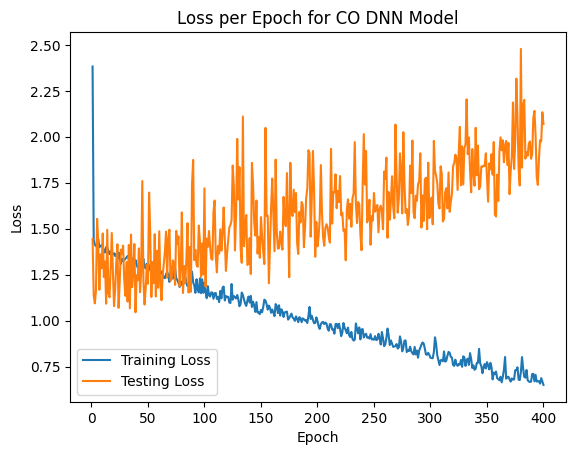

In [ ]:
# CO model
model = MLP().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
criterion = nn.MSELoss()

history = []

for epoch in range(1, epochs + 1):
  trn_loss = train_one_epoch(co_trn_loader)
  tst_loss = evaluate(co_tst_loader)

  history.append({
      "epoch": epoch,
      "train_loss": trn_loss,
      "test_loss": tst_loss
  })

  df = pd.DataFrame(history)

  # Print a progress line every 50 epochs
  if (epoch + 1) % 50 == 0:
    print(f'Epoch [{epoch+1}/{epochs}] | Training Loss: {trn_loss:.4f} | Testing Loss: {tst_loss:.4f}')

# Plot loss per epoch
plt.plot(df["epoch"],
         df["train_loss"],
         label = "Training Loss")
plt.plot(df["epoch"],
         df["test_loss"],
         label = "Testing Loss")
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title(f"Loss per Epoch for CO DNN Model")
plt.show()

# Get performance measures for CO DNN
X_tst_tensor = torch.from_numpy(X_tst.to_numpy()).float()
model.eval()
with torch.no_grad():
  y_dnn_co_pred = model(X_tst_tensor).numpy().squeeze()
new_row = model_eval("Deep Learning", "CO_shifted", y_dnn_co_pred)
co_metrics_df = pd.concat([co_metrics_df, new_row], ignore_index=True)

# Add predicted values to pred_vals_df
pred_vals_df["CO_dnn"] = y_dnn_co_pred

Epoch [50/400] | Training Loss: 892.0247 | Testing Loss: 1527.8694
Epoch [100/400] | Training Loss: 844.9346 | Testing Loss: 1471.8313
Epoch [150/400] | Training Loss: 775.3532 | Testing Loss: 1527.8401
Epoch [200/400] | Training Loss: 741.5893 | Testing Loss: 1666.8049
Epoch [250/400] | Training Loss: 696.9408 | Testing Loss: 1794.8389
Epoch [300/400] | Training Loss: 697.6526 | Testing Loss: 1872.1448
Epoch [350/400] | Training Loss: 674.3713 | Testing Loss: 2043.8814
Epoch [400/400] | Training Loss: 654.5627 | Testing Loss: 1853.8587


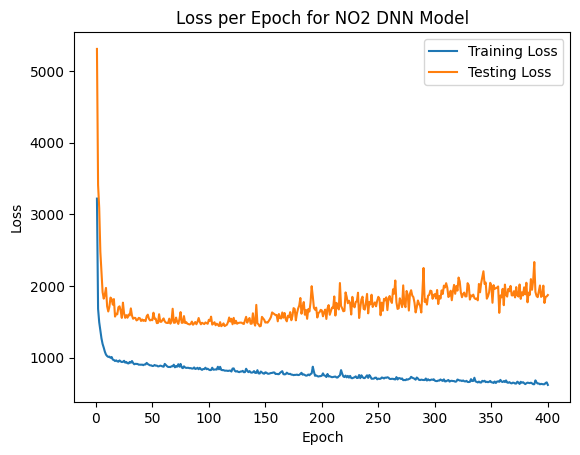

In [ ]:
# NO2 model
model = MLP().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
criterion = nn.MSELoss()

history = []

for epoch in range(1, epochs + 1):
  trn_loss = train_one_epoch(no2_trn_loader)
  tst_loss = evaluate(no2_tst_loader)

  history.append({
      "epoch": epoch,
      "train_loss": trn_loss,
      "test_loss": tst_loss
  })

  df = pd.DataFrame(history)

  # Print a progress line every 50 epochs
  if (epoch + 1) % 50 == 0:
    print(f'Epoch [{epoch+1}/{epochs}] | Training Loss: {trn_loss:.4f} | Testing Loss: {tst_loss:.4f}')

# Plot loss per epoch
plt.plot(df["epoch"],
         df["train_loss"],
         label = "Training Loss")
plt.plot(df["epoch"],
         df["test_loss"],
         label = "Testing Loss")
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title(f"Loss per Epoch for NO2 DNN Model")
plt.show()

# Get performance measures for NO2 DNN
model.eval()
with torch.no_grad():
  y_dnn_no2_pred = model(X_tst_tensor).numpy().squeeze()
new_row = model_eval("Deep Learning", "NO2_shifted", y_dnn_no2_pred)
no2_metrics_df = pd.concat([no2_metrics_df, new_row], ignore_index=True)

# Add predicted values to pred_vals_df
pred_vals_df["NO2_dnn"] = y_dnn_no2_pred

Epoch [50/400] | Training Loss: 33.7323 | Testing Loss: 26.0351
Epoch [100/400] | Training Loss: 30.9390 | Testing Loss: 33.2446
Epoch [150/400] | Training Loss: 28.3001 | Testing Loss: 28.1556
Epoch [200/400] | Training Loss: 25.2099 | Testing Loss: 27.8825
Epoch [250/400] | Training Loss: 25.0091 | Testing Loss: 33.0803
Epoch [300/400] | Training Loss: 21.6027 | Testing Loss: 38.4440
Epoch [350/400] | Training Loss: 19.1493 | Testing Loss: 33.6364
Epoch [400/400] | Training Loss: 16.7726 | Testing Loss: 41.1134


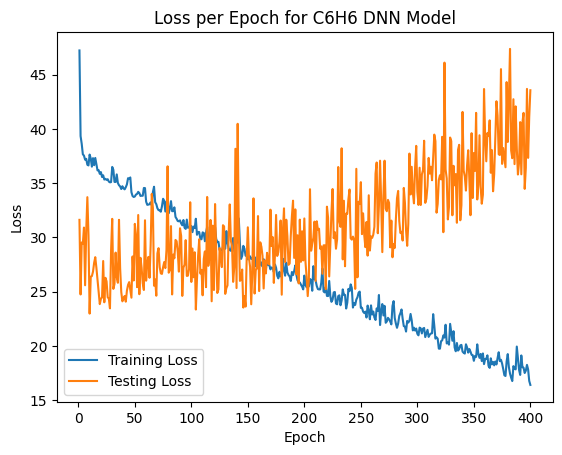

In [ ]:
# C6H6 model
model = MLP().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
criterion = nn.MSELoss()

history = []

for epoch in range(1, epochs + 1):
  trn_loss = train_one_epoch(c6h6_trn_loader)
  tst_loss = evaluate(c6h6_tst_loader)

  history.append({
      "epoch": epoch,
      "train_loss": trn_loss,
      "test_loss": tst_loss
  })

  df = pd.DataFrame(history)

  # Print a progress line every 50 epochs
  if (epoch + 1) % 50 == 0:
    print(f'Epoch [{epoch+1}/{epochs}] | Training Loss: {trn_loss:.4f} | Testing Loss: {tst_loss:.4f}')

# Plot loss per epoch
plt.plot(df["epoch"],
         df["train_loss"],
         label = "Training Loss")
plt.plot(df["epoch"],
         df["test_loss"],
         label = "Testing Loss")
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title(f"Loss per Epoch for C6H6 DNN Model")
plt.show()

# Get performance measures for NO2 DNN
model.eval()
with torch.no_grad():
  y_dnn_c6h6_pred = model(X_tst_tensor).numpy().squeeze()
new_row = model_eval("Deep Learning", "C6H6_shifted", y_dnn_c6h6_pred)
c6h6_metrics_df = pd.concat([c6h6_metrics_df, new_row], ignore_index=True)

# Add predicted values to pred_vals_df
pred_vals_df["C6H6_dnn"] = y_dnn_c6h6_pred

## Long Short-Term Memory Model

In [ ]:
# LSTM Model
class LSTM(nn.Module):
    def __init__(self):
        super().__init__()
        self.lstm = nn.LSTM(input_size=24, hidden_size=100, num_layers=1, batch_first=True)
        self.fc = nn.Linear(100, 1)
    def forward(self, x):
        x, _ = self.lstm(x)
        x = self.fc(x)
        return x

In [ ]:
# LSTM version of the model_eval function
def lstm_eval(y_true, y_pred):
  MSE = mean_squared_error(y_true, y_pred)
  MAE = mean_absolute_error(y_true, y_pred)
  r2 = r2_score(y_true, y_pred)

  metrics = {
    "Model": "LSTM",
    "Testing MSE": [MSE],
    "Testing MAE": [MAE],
    "Testing R2": [r2]
  }
  metrics_df = pd.DataFrame(metrics)
  return metrics_df

In [ ]:
# Data formatting for LSTM

# Function that outputs array of sequences of 24 measurements, column of the measurement 24 hours
# after the last measurement in each sequence, and the index of the last sequence
def create_sequences(data, shifted_data, seq_length):
    xs, ys, idxs = [], [], []
    for i in range(len(data) - 2*seq_length):
        x = data.iloc[i:(i + seq_length)]
        y = shifted_data.iloc[i - 1 + seq_length]
        idx = int(data.index[i - 1 + seq_length])
        xs.append(x)
        ys.append(y)
        idxs.append(idx)
    return np.array(xs), np.array(ys), idxs

X_co, y_co, idxs = create_sequences(air_qual["CO(GT)"], air_qual["CO_shifted"], 24)
X_no2, y_no2, idxs = create_sequences(air_qual["NO2(GT)"], air_qual["NO2_shifted"], 24)
X_c6h6, y_c6h6, idxs = create_sequences(air_qual["C6H6(GT)"], air_qual["C6H6_shifted"], 24)

# Roughly chronological 80-20 train/test split
# Same split point as other models even though these models will get slightly fewer training data
X_co_trn, X_co_tst = X_co[:split, :], X_co[split:, :]
y_co_trn, y_co_tst = y_co[:split], y_co[split:]

X_no2_trn, X_no2_tst = X_no2[:split, :], X_no2[split:, :]
y_no2_trn, y_no2_tst = y_no2[:split], y_no2[split:]

X_c6h6_trn, X_c6h6_tst = X_c6h6[:split, :], X_c6h6[split:, :]
y_c6h6_trn, y_c6h6_tst = y_c6h6[:split], y_c6h6[split:]

# As tensor DataLoaders
co_trn_loader = DataLoader(TensorDataset(torch.from_numpy(X_co_trn).float(),
                                            torch.from_numpy(y_co_trn).float().view(-1, 1)),
                              batch_size=batch_size, shuffle=True)
co_tst_loader = DataLoader(TensorDataset(torch.from_numpy(X_co_tst).float(),
                                            torch.from_numpy(y_co_tst).float().view(-1, 1)),
                              batch_size=batch_size, shuffle=True)
no2_trn_loader = DataLoader(TensorDataset(torch.from_numpy(X_no2_trn).float(),
                                            torch.from_numpy(y_no2_trn).float().view(-1, 1)),
                              batch_size=batch_size, shuffle=True)
no2_tst_loader = DataLoader(TensorDataset(torch.from_numpy(X_no2_tst).float(),
                                            torch.from_numpy(y_no2_tst).float().view(-1, 1)),
                              batch_size=batch_size, shuffle=True)
c6h6_trn_loader = DataLoader(TensorDataset(torch.from_numpy(X_c6h6_trn).float(),
                                            torch.from_numpy(y_c6h6_trn).float().view(-1, 1)),
                              batch_size=batch_size, shuffle=True)
c6h6_tst_loader = DataLoader(TensorDataset(torch.from_numpy(X_c6h6_tst).float(),
                                            torch.from_numpy(y_c6h6_tst).float().view(-1, 1)),
                              batch_size=batch_size, shuffle=True)

Epoch [50/400] | Training Loss: 1.2078 | Testing Loss: 0.9358
Epoch [100/400] | Training Loss: 1.1172 | Testing Loss: 0.9776
Epoch [150/400] | Training Loss: 0.9982 | Testing Loss: 1.0373
Epoch [200/400] | Training Loss: 0.9525 | Testing Loss: 1.0911
Epoch [250/400] | Training Loss: 0.8959 | Testing Loss: 1.1061
Epoch [300/400] | Training Loss: 0.8803 | Testing Loss: 1.1474
Epoch [350/400] | Training Loss: 0.8349 | Testing Loss: 1.1742
Epoch [400/400] | Training Loss: 0.8212 | Testing Loss: 1.2446


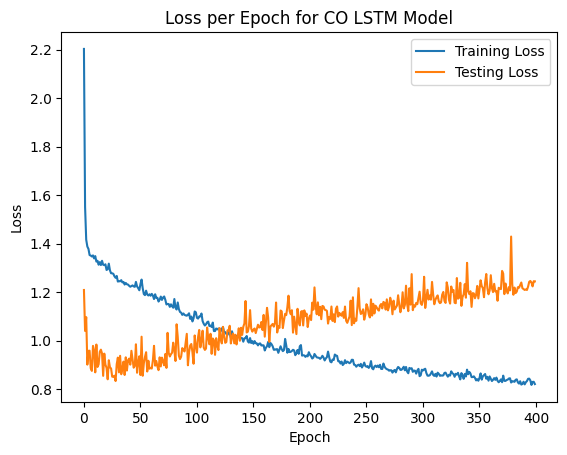

In [ ]:
# CO LSTM
model = LSTM()
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

history = []

for epoch in range(epochs):
  trn_loss = train_one_epoch(co_trn_loader)
  tst_loss = evaluate(co_tst_loader)

  history.append({
    "epoch": epoch,
    "train_loss": trn_loss,
    "test_loss": tst_loss
  })

  df = pd.DataFrame(history)

  if (epoch + 1) % 50 == 0:
    print(f'Epoch [{epoch+1}/{epochs}] | Training Loss: {trn_loss:.4f} | Testing Loss: {tst_loss:.4f}')

# Plot loss per epoch
plt.plot(df["epoch"],
         df["train_loss"],
         label = "Training Loss")
plt.plot(df["epoch"],
         df["test_loss"],
         label = "Testing Loss")
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title(f"Loss per Epoch for CO LSTM Model")
plt.show()

# Get performance measures for CO LSTM
X_tst_tensor = torch.from_numpy(X_co_tst).float()

model.eval()
with torch.no_grad():
  y_lstm_co_pred = model(X_tst_tensor).numpy().squeeze()
new_row = lstm_eval(y_co_tst, y_lstm_co_pred)
co_metrics_df = pd.concat([co_metrics_df, new_row], ignore_index=True)

Epoch [50/400] | Training Loss: 2018.2783 | Testing Loss: 3597.5685
Epoch [100/400] | Training Loss: 2020.2293 | Testing Loss: 3599.9159
Epoch [150/400] | Training Loss: 2022.1553 | Testing Loss: 3612.6838
Epoch [200/400] | Training Loss: 2021.2499 | Testing Loss: 3588.6275
Epoch [250/400] | Training Loss: 2017.5540 | Testing Loss: 3605.7082
Epoch [300/400] | Training Loss: 2020.5824 | Testing Loss: 3635.8392
Epoch [350/400] | Training Loss: 2021.8266 | Testing Loss: 3578.3386
Epoch [400/400] | Training Loss: 2021.3861 | Testing Loss: 3578.3843


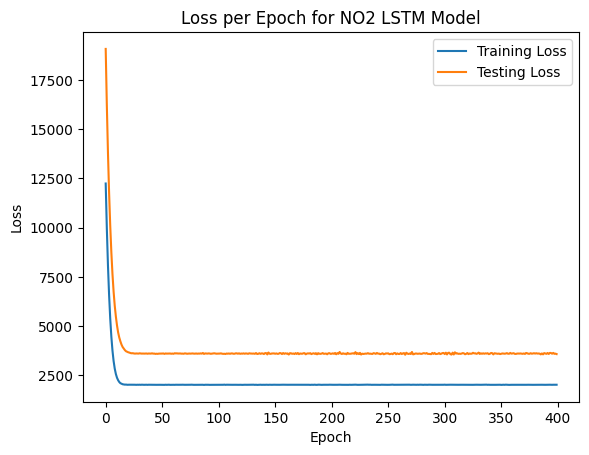

In [ ]:
# NO2 LSTM
model = LSTM()
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

history = []

for epoch in range(epochs):
  trn_loss = train_one_epoch(no2_trn_loader)
  tst_loss = evaluate(no2_tst_loader)

  history.append({
    "epoch": epoch,
    "train_loss": trn_loss,
    "test_loss": tst_loss
  })

  df = pd.DataFrame(history)

  if (epoch + 1) % 50 == 0:
    print(f'Epoch [{epoch+1}/{epochs}] | Training Loss: {trn_loss:.4f} | Testing Loss: {tst_loss:.4f}')

# Plot loss per epoch
plt.plot(df["epoch"],
         df["train_loss"],
         label = "Training Loss")
plt.plot(df["epoch"],
         df["test_loss"],
         label = "Testing Loss")
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title(f"Loss per Epoch for NO2 LSTM Model")
plt.show()

# Get performance measures for NO2 LSTM
X_tst_tensor = torch.from_numpy(X_no2_tst).float()

model.eval()
with torch.no_grad():
  y_lstm_no2_pred = model(X_tst_tensor).numpy().squeeze()
new_row = lstm_eval(y_no2_tst, y_lstm_no2_pred)
no2_metrics_df = pd.concat([no2_metrics_df, new_row], ignore_index=True)

Epoch [50/400] | Training Loss: 34.8712 | Testing Loss: 27.4214
Epoch [100/400] | Training Loss: 33.5099 | Testing Loss: 23.7205
Epoch [150/400] | Training Loss: 32.9452 | Testing Loss: 26.3038
Epoch [200/400] | Training Loss: 32.1195 | Testing Loss: 27.2784
Epoch [250/400] | Training Loss: 31.2446 | Testing Loss: 29.5777
Epoch [300/400] | Training Loss: 30.9647 | Testing Loss: 30.7291
Epoch [350/400] | Training Loss: 30.7749 | Testing Loss: 29.7711
Epoch [400/400] | Training Loss: 31.1555 | Testing Loss: 30.1613


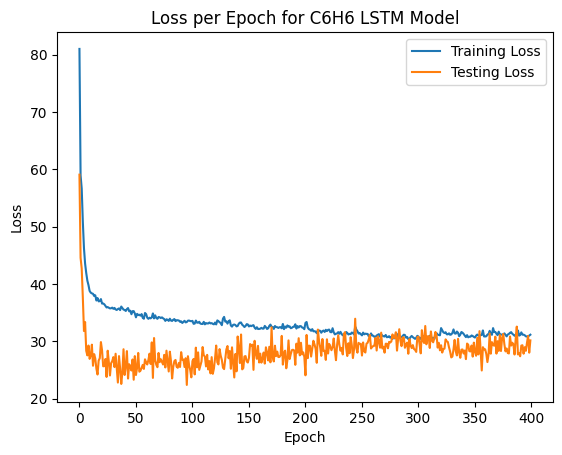

In [ ]:
# C6H6 LSTM
model = LSTM()
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

history = []

for epoch in range(epochs):
  trn_loss = train_one_epoch(c6h6_trn_loader)
  tst_loss = evaluate(c6h6_tst_loader)

  history.append({
    "epoch": epoch,
    "train_loss": trn_loss,
    "test_loss": tst_loss
  })

  df = pd.DataFrame(history)

  if (epoch + 1) % 50 == 0:
    print(f'Epoch [{epoch+1}/{epochs}] | Training Loss: {trn_loss:.4f} | Testing Loss: {tst_loss:.4f}')

# Plot loss per epoch
plt.plot(df["epoch"],
         df["train_loss"],
         label = "Training Loss")
plt.plot(df["epoch"],
         df["test_loss"],
         label = "Testing Loss")
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title(f"Loss per Epoch for C6H6 LSTM Model")
plt.show()

# Get performance measures for C6H6 LSTM
X_tst_tensor = torch.from_numpy(X_c6h6_tst).float()

model.eval()
with torch.no_grad():
  y_lstm_c6h6_pred = model(X_tst_tensor).numpy().squeeze()
new_row = lstm_eval(y_c6h6_tst, y_lstm_c6h6_pred)
c6h6_metrics_df = pd.concat([c6h6_metrics_df, new_row], ignore_index=True)

## Performance Measures for Each Set of Models

In [ ]:
# CO Models Performance Measures
co_metrics_df

,Model,Testing MSE,Testing MAE,Testing R2
0,Elastic Net,0.986348,0.736720,0.365098
1,Random Forest,1.044677,0.815496,0.327553
2,XGboost,1.069034,0.787507,0.311874
3,Deep Learning,2.069491,1.055219,-0.332110
4,LSTM,1.231606,0.840062,0.214716


In [ ]:
# NO2 Models Performance Measures
no2_metrics_df

,Model,Testing MSE,Testing MAE,Testing R2
0,Elastic Net,1400.525700,29.211675,0.429203
1,Random Forest,1508.485094,30.324014,0.385203
2,XGboost,1329.473389,28.525257,0.458161
3,Deep Learning,1873.272364,33.735986,0.236531
4,LSTM,3572.557598,47.237886,-0.479434


In [ ]:
# C6H6 Models Performance Measures
c6h6_metrics_df

,Model,Testing MSE,Testing MAE,Testing R2
0,Elastic Net,22.036096,3.487265,0.391405
1,Random Forest,27.026892,4.073719,0.253569
2,XGboost,26.049510,3.891589,0.280562
3,Deep Learning,43.572912,4.896405,-0.203401
4,LSTM,30.279725,4.366924,0.173387


Across all three groups of regression models, we see the strongest performance from the Elastic Net model by all measures. The poor performance of the DNN models is especially surprising, given the non-linearity of this model and large number of epochs for training.

In [ ]:
# Dataframe of all predicted values
pred_vals_df.head()

,CO_actual,NO2_actual,C6H6_actual,CO_en,NO2_en,C6H6_en,C6H6_rf,CO_rf,NO2_rf,C6H6_xgboost,CO_xgboost,NO2_xgboost,CO_dnn,NO2_dnn,C6H6_dnn
7902,1.2,161.0,6.4,1.893231,155.021240,6.687684,11.434171,2.537695,153.763243,11.038297,2.287560,166.638046,1.185769,174.780731,11.508213
7903,1.2,147.0,5.1,1.767749,149.592185,6.579458,10.296907,2.126369,144.913102,9.480214,1.772845,155.868881,0.584934,172.077347,9.964617
7904,0.7,111.0,3.3,1.393028,132.599673,4.712045,6.774537,1.905894,134.894698,7.267439,1.984607,152.039581,0.713035,125.353577,8.536247
7907,0.4,80.0,2.2,1.042940,116.051551,3.824874,4.990816,1.451348,115.380103,4.949088,0.951306,130.901428,0.387698,105.248917,5.484037
7908,0.7,122.0,3.9,1.058552,129.791271,3.779115,5.323712,1.463079,131.916494,8.806541,1.145521,138.958817,0.150052,111.458420,6.350984


# Clustering


#### Motivation
In the weather forecast, people talk about air quality level based on gas concentrations. In our project, we want to forecasting air quality level for the next day based on the data in previous days. Instead of knowing a specific value of each gas's concentration, people are more interested in knowing whether the air quality is good, moderate, or bad. So we need to report categories. Since our data does not include variable desribing the level of air quality, we cannot do supervised learning. Instead, we can do clustering.
#### Variable used
According to U.S. Air Quality Index [https://document.airnow.gov/technical-assistance-document-for-the-reporting-of-daily-air-quailty.pdf], we measure ozone, particals, carbon monoxide, nitrogen dioxide, sulfer dioxide to describe air quality. However, we only consider the carbon monoxide (CO), nitrogen monoxide (NO2), plus extra gas benzene (C6H6) for reality and simplicity.

#### Method
We worked on the commonly used Kmeans clustering at first, but the data are overlapping so the performance is not ideal. Finally, we choose **Hierarchical Clustering** as our method because it can recognize feature for different clusters even when data are not separate too much.

**Hierarchical Clustering**
- A method that does not require initializing number of clusters we want. It starts from observing the similarity between each individual points pairwisely, and groups them into a cluster with only two points. Then repeat this process with each pairwise group until it hits one large group or stoppes at any number of groups we want.
- Similarity measured by Ward's method: similarity of the two clusters is defined by the increase in squared error when two clusters are merged.
- The dendrogram shows how the clusters are formed and merged. We cut at a stage to get 3 clusters.



In [ ]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
import plotly.express as px

X = pred_vals_df[['CO_actual', 'NO2_actual', 'C6H6_actual']] # select variables for to cluster
clustering = AgglomerativeClustering(n_clusters=3)
labels = clustering.fit_predict(X)

agg = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
agg.fit(X)


def plot_dendrogram(model, **kwargs):
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)

    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]).astype(float)
    dendrogram(linkage_matrix, **kwargs)

X['cluster'] = labels # add clusters into the dataset for plot
X.head()

/tmp/ipython-input-765624977.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['cluster'] = labels # add clusters into the dataset for plot


,CO_actual,NO2_actual,C6H6_actual,cluster
7902,1.2,161.0,6.4,0
7903,1.2,147.0,5.1,0
7904,0.7,111.0,3.3,0
7907,0.4,80.0,2.2,2
7908,0.7,122.0,3.9,0


Base on centroids, cluster = 0 represents moderate air quality, cluster = 1 represents bad air quality, cluster = 2 represents good air quality.

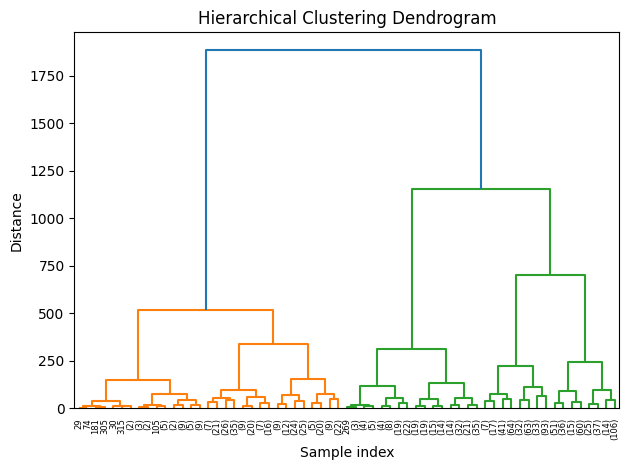

In [ ]:
fig = px.scatter_3d(x=X['CO_actual'], y=X['NO2_actual'], z=X['C6H6_actual'], color=labels)
fig.show()

plot_dendrogram(agg, truncate_mode='level', p=5)
plt.title("Hierarchical Clustering Dendrogram")
plt.xlabel("Sample index")
plt.ylabel("Distance")

plt.tight_layout()
plt.show()

### Silhouette Score

Silhouette Score is a measure for how well the clusters are separated.

Formula:
$$s_i=\frac{b_i-a_i}{max(a_i, b_i)}$$
where $a_i$ is the average distance of ith point to all other points in the same cluster, and $b_i$ is the minimum average distance of the ith point to other points in all different clusters. Then take the average of all $s_i$.

Silhouette Score: 0.48934147636076303


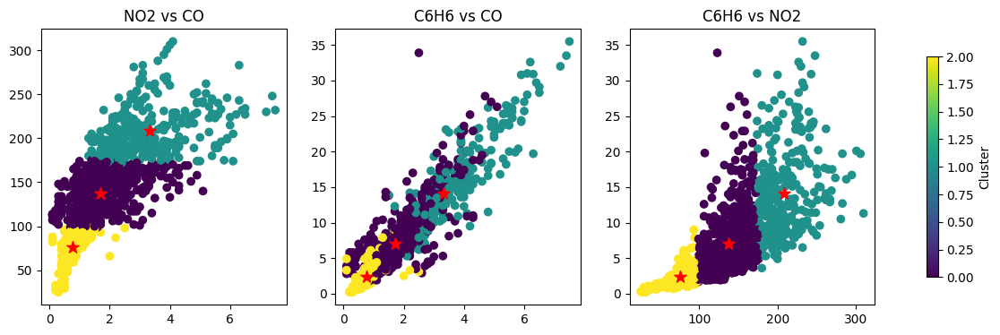

[[  1.70273775 137.17435159   6.99827089]
 [  3.31414791 208.45016077  14.07041801]
 [  0.76425532  75.68510638   2.34808511]]


In [ ]:
from sklearn.metrics import silhouette_score
sil_score = silhouette_score(X, labels)
print("Silhouette Score:", sil_score)

# compute centroids
centroids = np.array([X[labels == k][['CO_actual', 'NO2_actual', 'C6H6_actual']].mean().values
                      for k in np.unique(labels)])
centroids_CO = centroids[:, 0]
centroids_NO2 = centroids[:, 1]
centroids_C6H6 = centroids[:, 2]

# 2d visualization
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 4))

plt1 = ax1.scatter(X['CO_actual'], X['NO2_actual'], c=X['cluster'])
ax1.scatter(centroids_CO, centroids_NO2, marker='*', s=100, color='red')
ax1.set_title("NO2 vs CO")

plt2 = ax2.scatter(X['CO_actual'], X['C6H6_actual'], c=X['cluster'])
ax2.scatter(centroids_CO, centroids_C6H6, marker='*', s=100, color='red')
ax2.set_title("C6H6 vs CO")

plt3 = ax3.scatter(X['NO2_actual'], X['C6H6_actual'], c=X['cluster'])
ax3.scatter(centroids_NO2, centroids_C6H6, marker='*', s=100, color='red')
ax3.set_title("C6H6 vs NO2")

cbar = fig.colorbar(plt1, ax=[ax1, ax2, ax3], shrink=0.8)
cbar.set_label("Cluster")
plt.show()

print(centroids)

### Apply to forecasted data

Use a classification method connected to the centroids to assign a label to the the forecasted data.

In [ ]:
from scipy.spatial.distance import cdist

# Elastic net result
en_df = pred_vals_df[['CO_en', 'NO2_en', 'C6H6_en']]
array_en = en_df.to_numpy()
dist_en = cdist(array_en, centroids, metric='euclidean')

# assign data a label based on the minimun distance to the centroid
en_labels = np.argmin(dist_en, axis=1)
en_df['cluster_en'] = en_labels

# accuracy of the label assignment
en_count = np.count_nonzero(en_labels - X['cluster'].to_numpy())
en_proportion = 1 - en_count / len(pred_vals_df)
print("Forecasting accuracy: ", en_proportion)
en_df.head()

Forecasting accuracy:  0.6459677419354839


/tmp/ipython-input-3754696496.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,CO_en,NO2_en,C6H6_en,cluster_en
7902,1.893231,155.021240,6.687684,0
7903,1.767749,149.592185,6.579458,0
7904,1.393028,132.599673,4.712045,0
7907,1.042940,116.051551,3.824874,0
7908,1.058552,129.791271,3.779115,0


In [ ]:
# random forest result
rf_df = pred_vals_df[['CO_rf', 'NO2_rf', 'C6H6_rf']]
array_rf = rf_df.to_numpy()
dist_rf = cdist(array_rf, centroids, metric='euclidean')

# assign data a label based on the minimun distance to the centroid
rf_labels = np.argmin(dist_rf, axis=1)
rf_df['cluster_rf'] = rf_labels

# accuracy of the label assignment
rf_count = np.count_nonzero(rf_labels - X['cluster'].to_numpy())
rf_proportion = 1 - rf_count / len(pred_vals_df)
print("Forecasting accuracy: ", rf_proportion)

rf_df.head()

Forecasting accuracy:  0.6314516129032258


/tmp/ipython-input-3691551382.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,CO_rf,NO2_rf,C6H6_rf,cluster_rf
7902,2.537695,153.763243,11.434171,0
7903,2.126369,144.913102,10.296907,0
7904,1.905894,134.894698,6.774537,0
7907,1.451348,115.380103,4.990816,0
7908,1.463079,131.916494,5.323712,0


In [ ]:
# XGBoost
xgboost_df = pred_vals_df[['CO_xgboost', 'NO2_xgboost', 'C6H6_xgboost']]
array_xgboost = xgboost_df.to_numpy()
dist_xgboost = cdist(array_xgboost, centroids, metric='euclidean')

# assign data a label based on the minimun distance to the centroid
xgboost_labels = np.argmin(dist_xgboost, axis=1)
xgboost_df['cluster_xgboost'] = xgboost_labels

# accuracy of the label assignment
xgboost_count = np.count_nonzero(xgboost_labels - X['cluster'].to_numpy())
xgboost_proportion = 1 - xgboost_count / len(pred_vals_df)
print("Forecasting accuracy: ", xgboost_proportion)

xgboost_df.head()

Forecasting accuracy:  0.6395161290322581


/tmp/ipython-input-2402858753.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,CO_xgboost,NO2_xgboost,C6H6_xgboost,cluster_xgboost
7902,2.287560,166.638046,11.038297,0
7903,1.772845,155.868881,9.480214,0
7904,1.984607,152.039581,7.267439,0
7907,0.951306,130.901428,4.949088,0
7908,1.145521,138.958817,8.806541,0


In [ ]:
# DNN
dnn_df = pred_vals_df[['CO_dnn', 'NO2_dnn', 'C6H6_dnn']]
array_dnn = dnn_df.to_numpy()
dist_dnn = cdist(array_dnn, centroids, metric='euclidean')

# assign data a label based on the minimun distance to the centroid
dnn_labels = np.argmin(dist_dnn, axis=1)
dnn_df['cluster_dnn'] = dnn_labels

# accuracy of the label assignment
dnn_count = np.count_nonzero(dnn_labels - X['cluster'].to_numpy())
dnn_proportion = 1 - dnn_count / len(pred_vals_df)
print("Forecasting accuracy: ", dnn_proportion)

dnn_df.head()

Forecasting accuracy:  0.5814516129032259


/tmp/ipython-input-3353141023.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,CO_dnn,NO2_dnn,C6H6_dnn,cluster_dnn
7902,1.185769,174.780731,11.508213,1
7903,0.584934,172.077347,9.964617,0
7904,0.713035,125.353577,8.536247,0
7907,0.387698,105.248917,5.484037,2
7908,0.150052,111.458420,6.350984,0


## Conclusions

In this final project, we did forecasting on the CO, NO2, C6H6 concentration and category assignment with one day shifted later. We applied Conformal Prediction, Elastic Net Regression, Random Forest, XGBoost, DNN, and LSTM to get the concentration. Results shows that confromal prediction interval covers most of the actual or true values, but the interval is too wide that makes the forecasting not robust.

Comparing the rest of the models, Elastic Net is the best, followed by XGBoost and Random Forest. Suprisingly, DNN and LSTM perform the worst with some R squares being negative. Most of the time, the best model R square implies that the model can only explain 30 to 40 percent of the total variation. This is not ideal but acceptable considering the real world forecasting.

Finally, we performed hierarchical clustering to change the problem from numeric to categorical. All model forecasting can be categorized into good, moderate, bad air quality condition with around 60 percent accuracy, which we think the result is acceptable.

### Thougts and challenges
We think about the challenges on doing forecasting in this data. Weaker correlation between the sensors and the shifted target variables may be a problem that causes the unreliable results. On one hand, we used a chronological train-test split instead of a random one so we didn't train on a complete year of data could also be a problem. One the other hand, air quality forecasting may not need to use the whold historical data, it probably only rely on the information from one or two previous days like a stochastic process. However, for specific model like DNN and LSTM, we still don't know why they perform worse than Elastic Net.